In [36]:
%matplotlib inline
import matplotlib.pyplot as plt
import networkx as nx
from ipywidgets import interact
import pandas as pd
import itertools
import json

from bokeh.io import show, output_notebook
from bokeh.plotting import figure

output_notebook()

Loading BokehJS ...

# Data with relations

In [2]:
d1 = json.loads(open('../data/clima-related-filtered/bubbles1.json').read())
d2 = json.loads(open('../data/clima-related-filtered/bubbles2.json').read())

id2name = json.loads(open('../data/id2name.json').read())

In [3]:
d1

{'cfact': {'label': 'neg',
  'poz-count': 0,
  'neg-count': 5,
  'poz': [],
  'neg': ['wattsupwiththat-133662869999306',
   'FoSClimateEd',
   'The-Galileo-Movement-101728306584541',
   'CFACTCampus',
   'isthereglobalcooling'],
  'wave': 'initial'},
 'iloveco2': {'label': 'neg',
  'poz-count': 2,
  'neg-count': 9,
  'poz': ['ClimateHomeNews', 'iHeartClimateScientists'],
  'neg': ['inconvenientfacts.xyz',
   'theGWPF',
   'The-Galileo-Movement-101728306584541',
   'wattsupwiththat-133662869999306',
   'wwpagws',
   'LordMonckton',
   'thepursuitofenergy',
   'FoSClimateEd',
   'R2ANM'],
  'wave': 'related 1st'},
 'ClimateChangeLIES': {'label': 'neg',
  'poz-count': 3,
  'neg-count': 7,
  'poz': ['IPCC', 'SkepticalScience', 'DeSmogBlog'],
  'neg': ['wattsupwiththat-133662869999306',
   'The-Galileo-Movement-101728306584541',
   'FoSClimateEd',
   'AboveClimateChange',
   'LordMonckton',
   'theGWPF',
   'inconvenientfacts.xyz'],
  'wave': 'related 1st'},
 'australianclimatemadness': {'l

In [4]:
set(d1.keys()) & set(d2.keys())

set()

In [5]:
# id2name = {}
with open('../data/init-page-vs-manual-label') as fw:
    for line in fw.readlines()[1:]:
        tmp = line.split(';')
        if str(tmp[1]) not in id2name:
            id2name[str(tmp[1])] = str(tmp[0])

In [6]:
# name2id = {str(row['name']): row['id_url'] for i, row in labels.iterrows()}
# id2name = {row['id_url']: str(row['name']) for i, row in labels.iterrows()}

In [7]:
id2name

{'UNEPROAP': 'UN Environment Programme in Asia Pacific',
 'MefEth': 'Environment , Forest and climate change Commission',
 'IPBES': 'IPBES',
 'UNREDDprogramme': 'UN-REDD Programme (FAO/UNDP/UNEP)',
 'advanceaust': 'Advance Australia',
 'InternationalScience': 'International Science Council',
 'SkepticalScience': 'Skeptical Science',
 'WorldWarZeroOrg': 'World War Zero',
 'SaveTheEarthReduceChildbirth': 'Save the Earth, Reduce Childbirth',
 'UNOCHA': 'United Nations OCHA',
 '122361961141543': 'Water Pollution Forum',
 'MichaelMannScientist': 'Michael E. Mann',
 'TheWildernessSociety': 'The Wilderness Society',
 'ThisIsZeroHour': 'Zero Hour',
 'IntelligentLiving': 'Intelligent Living',
 'XRJustice': 'Extinction Rebellion Justice',
 'HeartlandInstitute': 'Heartland Institute',
 'TEDEducation': 'TED-Ed',
 '136241923085699': 'Pennsylvania Coalition for Responsible Government',
 'YearsOfLiving': 'The Years Project',
 'SustDev': 'UN Sustainable Development Platform',
 'LCVoters': 'League of C

In [8]:
pages = (list(set(d1.keys())) + 
         list(set(d2.keys())) + 
         [p for k, v in d2.items() for p in v['poz']] + 
         [p for k, v in d2.items() for p in v['neg']])

print(len(pages), len(list(set(pages))))
pages = list(set(pages))
for p in pages:
    if p not in id2name:
        print(p)
        
page2id = {name: i for i, name in enumerate(pages)}

544 280
ClimateChangeCauses
ClimateChangeNews
ClimateChangeIsReal
cnbcinternational


## Create the graph

In [9]:
def create_graph(d1, d2, id2name, page2id, directed=True):
    G = nx.DiGraph() if directed else nx.Graph()  
    
    pages = list(set(d1.keys())) + list(set(d2.keys()))
    added = []
    
    # Add nodes
    for idd, d in enumerate([d1, d2]):
        for i, (page, val) in enumerate(d.items()):
#             print(i, page, val)
            breaking = ('yes' if (val['label'] == 'poz' and val['neg-count'] > 0 or 
                                 val['label'] == 'neg' and val['poz-count'] > 0) else 'no')
           
            name = id2name[page] if page in id2name else page
                
            G.add_node(page2id[page], page=page, name=name, 
                       layer=val['wave'], label=val['label'], breaking=breaking)
            added.append(page)
            
            if idd == 1:
                for page2 in val['poz']:
                    if page2 not in added:
                        G.add_node(page2id[page2], page=page2, name=name, 
                           layer='related 2nd', label='poz', breaking=breaking)
                for page2 in val['neg']:
                    if page2 not in added:
                        G.add_node(page2id[page2], page=page2, name=name, 
                           layer='related 2nd', label='neg', breaking=breaking)

    # Add edges
    for dfn in [d1, d2]:
        for page, val in dfn.items():
            for split in [val['poz'], val['neg']]:
                for page2 in split:
                    if page != page2 and page in page2id and page2 in page2id:
                        G.add_edge(page2id[page], page2id[page2])
                    else:
                        print(page, page2)
    return G

In [10]:
G = create_graph(d1, d2, id2name, page2id)

In [11]:
print(f"Nodes: {len(G.nodes)}\nEdges: {len(G.edges)}")

Nodes: 280
Edges: 582


## Bokeh Visualizations

In [75]:
from bokeh.models import Range1d, Plot, HoverTool, BoxZoomTool, ResetTool, SaveTool, MultiLine, NodesAndLinkedEdges
from bokeh.models import WheelZoomTool, PanTool, Circle, Legend, LegendItem
from bokeh.palettes import Spectral4
from bokeh.plotting import from_networkx
from bokeh.transform import factor_cmap
from bokeh.io import output_file
from bokeh.palettes import d3, Paired

# We could use figure here but don't want all the axes and titles
plot = Plot(x_range=Range1d(-2, 2),
            y_range=Range1d(-2, 2),
            plot_width=800,
            plot_height=800)
plot.add_tools(HoverTool(tooltips=[("name", "@name"), ("page", "@page"), 
                                   ("layer", "@layer"), ("label", "@label"),
                                   ("breaking", "@breaking")]),
               BoxZoomTool(),
               ResetTool(),
               SaveTool(),
               WheelZoomTool(),
               PanTool())
plot.title.text = "Related FB Pages"

# Create a Bokeh graph from the NetworkX input using nx.spring_layout
graph = from_networkx(G,
                      nx.spring_layout,
                      scale=1.8,
                      center=(0,0))


# graph.node_renderer.data_source.data['colors'] = [n['layer'] if 'layer' in n else 'related_1' for i, n in G.nodes(data=True)]
# graph.node_renderer.data_source.data['colors'] = [n['breaking'] for _, n in G.nodes(data=True)]
graph.node_renderer.data_source.data['colors'] = [n['label']+n['breaking'] for _, n in G.nodes(data=True)]
graph.node_renderer.hover_glyph = Circle(size=15, fill_color=Spectral4[1])
plot.renderers.append(graph)

# Set some of the default node glyph (Circle) properties
# graph.node_renderer.glyph.update(size=10, fill_color=factor_cmap('colors',
#                                                                  factors=['initial', 'related_1', 'related_2'],
#                                                                  palette=d3['Category10'][3]))

mapper = factor_cmap('colors', factors=['negno', 'negyes', 'pozno', 'pozyes',], palette=Paired[4])
graph.node_renderer.glyph.update(size=10, fill_color=mapper)


# Set some edge properties too
graph.edge_renderer.glyph = MultiLine(line_color='grey', line_alpha=0.5, line_width=1)
graph.edge_renderer.hover_glyph = MultiLine(line_color='red', line_width=1)
graph.inspection_policy = NodesAndLinkedEdges()


# legend1 = Legend(title="NDVI", background_fill_color='gold',
#                  items=[LegendItem(label='0', renderers=[gly]) for lab, gly in zip(legend_labels, dummy_for_legend) ])
# plot.add_layout(legend1)

plot.renderers.append(graph)
output_notebook()
show(plot)

# Save the plot
output_file("interactive_graph_labeled.html")

Loading BokehJS ...

## Edge Bundling Try

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
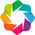

In [13]:
import networkx as nx
from holoviews import opts
import holoviews as hv
hv.extension('bokeh')

defaults = dict(width=400, height=400)
hv.opts.defaults(
    opts.EdgePaths(**defaults), opts.Graph(**defaults), opts.Nodes(**defaults))

In [14]:
kwargs = dict(width=800, height=800, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))

In [15]:
gg = hv.Graph.from_networkx(G, nx.layout.circular_layout).opts(tools=['hover'])
gg

:Graph   [start,end]

In [16]:
from holoviews.operation.datashader import bundle_graph
bundled = bundle_graph(gg)
bundled

:Graph   [start,end]

In [17]:
from holoviews.operation.datashader import datashade
(datashade(bundled, normalization='linear', width=800, height=800) * bundled.nodes).opts(
    opts.Nodes(color='circle', size=10, width=1000, legend_position='right'))

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Nodes.I :Nodes   [x,y,index]   (breaking,label,layer,name,page)

In [18]:
datashade(bundle_graph(gg), normalization='linear', width=800, height=800) *\
bundled.select(circle='circle15').opts(node_fill_color='white')

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Graph.I :Graph   [start,end]